# PeTar Data Analysis Sample

This sample demonstrates a basic usage of the data analysis module in Python. Users can find additional information about the data analysis module in the README on the PeTar GitHub page.

To utilize the data analysis module, users should first import `petar` and other essential modules for data analysis.

In [56]:
import petar
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Users can duplicate the sample scripts located in the `sample` directory, specifically those named `star_cluster*.sh`, to a new directory of their choice. Depending on whether SSE/BSE and Galpy are enabled or not, the reading method requires different keyword arguments. Below, three distinct scenarios are presented to illustrate this.

# Pure Gravity Scenario

Upon executing the script `star_cluster.sh` to generate a star cluster model, it is essential to specify the path to this directory in the following steps.

In [57]:
# path to the simulation directory
path='/home/suphysics3/astro/PeTar/runs/mw2014_agama/'
import sys
sys.path.append('/usr/local/bin')
import petar

## Reading Snapshots

Use `petar.PeTarDataHeader` to read the header line of snapshot, when snapshot is ASCII format:

In [58]:
prefix='data'
sse_type=petar.SSETypeChange()
sse_type.loadtxt(path+prefix+'.sse.type_change')
sse_kick=petar.SSESNKick()
sse_kick.loadtxt(path+prefix+'.sse.sn_kick')
bse_type=petar.BSETypeChange()
bse_type.loadtxt(path+prefix+'.bse.type_change')
bse_kick=petar.BSESNKick()
bse_kick.loadtxt(path+prefix+'.bse.sn_kick')
# bse_dyn=petar.BSEDynamicMerge()
# bse_dyn.loadtxt(path+prefix+'.bse.dynamic_merge')

In [59]:
bse_type.printTable([('type','%4d','type'),('init.time','%10g','init.time'),('init.type1','%11d','init.type1'),('init.type2','%11d','init.type2'),
                     ('init.m1','%9f','init.m1'),('init.m2','%9f','init.m2'),('init.semi','%10g','init.semi'),('init.ecc','%9f','init.ecc'),
                     ('final.type1','%12d','final.type1'),('final.type2','%12d','final.type2'),('final.m1','%9f','final.m1'),('final.m2','%9f','final.m2'),
                     ('final.semi','%11g','final.semi'),('final.ecc','%10g','final.ecc')])

type init.time init.type1 init.type2  init.m1  init.m2 init.semi init.ecc final.type1 final.type2 final.m1 final.m2 final.semi final.ecc
  13         0          1          1 2.335943 2.335943  -8664.39 5.330441           1           1 2.335943 2.335943    8660.66   5.33044
  13   29.5635          1          1 2.335799 2.335799  -6804.52 6.129230           1           1 2.335799 2.335799    6801.59   6.12923
  13   29.5636          1          1 2.335799 2.335799  -6166.76 7.933100           1           1 2.335799 2.335799     6164.1    7.9331
  13   29.5636          1          1 2.335799 2.335799  -44040.1 1.034077           1           1 2.335799 2.335799    44021.1   1.03408
  13   29.5638          1          1 2.335799 2.335799  -559.22919.343646           1           1 2.335799 2.335799    558.988   19.3436
  13   29.5638          1          1 2.335799 2.335799  -38852.5 1.475268           1           1 2.335799 2.335799    38835.8   1.47527
  13    29.564          1          1 2.33

/home/suphysics/Astrophysics/PeTar/tools/build/__editable__.petar-1.0.0-py3-none-any/petar/base.py:568: SyntaxWarning: invalid escape sequence '\.'
  fmt_title += re.sub('\.[0-9]*[a-zA-Z]','s',fmt)


KeyboardInterrupt: 

In [ ]:
filename = 'data.8'
header = petar.PeTarDataHeader(path+filename, external_mode=True)
print('Time',header.time, '\nN',header.n, '\nFile ID',header.file_id)

Time 200.0 
N 149996 
File ID 100


Use `petar.Particle` to read the particle information in the snapshot. The first line is skiped.

In [ ]:
particle = petar.Particle()
particle.loadtxt(path+filename,skiprows=1)

/home/suphysics/Astrophysics/PeTar/tools/build/__editable__.petar-1.0.0-py3-none-any/petar/base.py:164: UserWarning: The reading data shape[1] or the number of columns (35) mismatches the number of columns defined in the class instance (20)! Make sure whether this is intended and whether you properly choose the correct keyword arguments for the class instance initialziation
  warnings.warn('The reading data shape[1] or the number of columns (%d) mismatches the number of columns defined in the class instance (%d)! Make sure whether this is intended and whether you properly choose the correct keyword arguments for the class instance initialziation' % (_dat.shape[1], self.ncols+_offset))


Use `calcR2` to calculate distance of particles to the center and plot the density profile

Text(0, 0.5, 'Count')

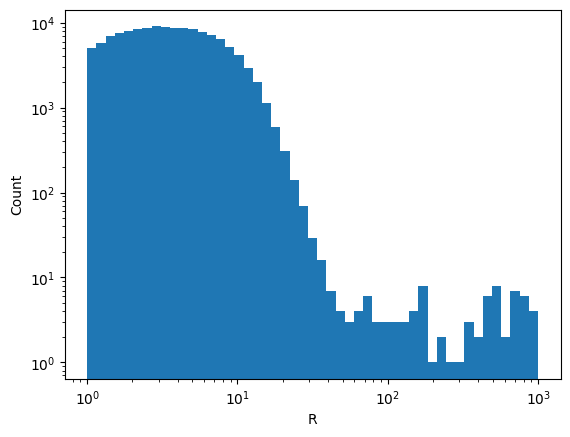

In [ ]:
fig, axes=plt.subplots(1,1)
# calculat R2
particle.calcR2()
# calculate R
r = np.sqrt(particle.r2)
# plot histogram of r
axes.hist(r, bins=np.logspace(0,3,50))
axes.set_xscale('log')
axes.set_yscale('log')
axes.set_xlabel('R')
axes.set_ylabel('Count')

## Plot the positions of stars

To plot positions of stars in the x-y plane, where the colors of the points indicate the stellar mass.

Text(0, 0.5, 'y')

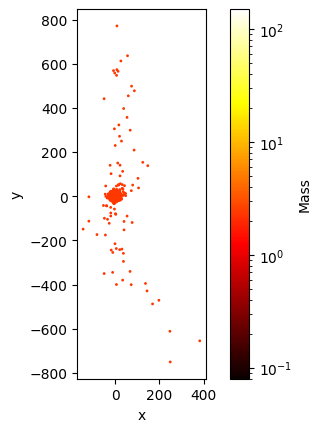

In [ ]:
import matplotlib.colors as colors

fig, axes=plt.subplots(1,1)
x = particle.pos[:,0]
y = particle.pos[:,1]
pt = axes.scatter(x, y, s=1, cmap='hot', norm=colors.LogNorm(vmin=0.08, vmax=150), c=particle.mass)
cb = plt.colorbar(pt)
cb.set_label('Mass')
axes.set_aspect(1)
axes.set_xlabel('x')
axes.set_ylabel('y')

## Making Selection

Create a subset of particles with distance to the cluter center < 10

In [ ]:
# calculate the cluster distance square
particle.calcR2()

# make selection
sel = (particle.r2 < 100) 

# create a subset of data
subset = particle[sel]

Plot positions of stars in the x-y plane with distances < 10 

Text(0, 0.5, 'y')

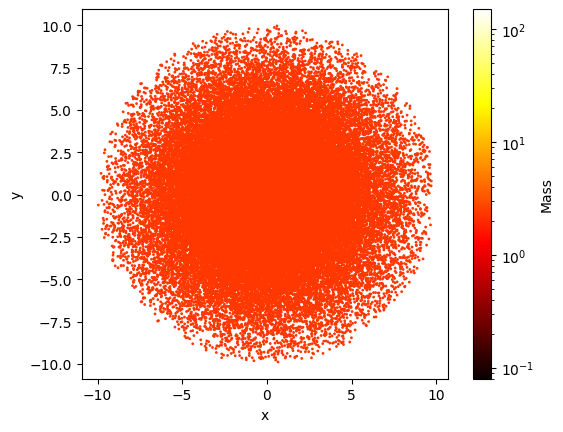

In [ ]:
import matplotlib.colors as colors

fig, axes=plt.subplots(1,1)

x = subset.pos[:,0]
y = subset.pos[:,1]
pt = axes.scatter(x, y, s=1, cmap='hot', norm=colors.LogNorm(vmin=0.08, vmax=150), c=subset.mass)
cb = plt.colorbar(pt)
cb.set_label('Mass')
axes.set_aspect(1)
axes.set_xlabel('x')
axes.set_ylabel('y')

## Printing Data in a Table

Use `printTable` function, users can select the members to print with specified format. The following samples print the mass, x, y, z of the first 10 members in the subset of particles.

In [ ]:
subset[:10].printTable([('mass','%10.5g', 'mass'),('pos[0]','%20.14g', 'pos[0]'),('pos[1]','%20.14g', 'pos[1]'),('pos[2]','%20.14g', 'pos[2]')])

      mass              pos[0]              pos[1]              pos[2]
    2.3348     0.4017036650924    0.70138832961204     -0.300883837504
    2.3348     1.4473890150277     0.9881928471135    0.97317351412157
    2.3348     4.6496595670229   -0.40695644967205    -3.0902689796454
    2.3348    0.44912106938122   -0.52280823293102    -1.4393362465755
    2.3348   -0.49754847280169     3.2122101985637    -3.8984053858408
    2.3348    0.76798688448803    0.71864449965933   -0.87960783348134
    2.3348     7.6363418066545    0.19737187859262     2.8717847245252
    2.3348   -0.20473043412703       3.77129093851      4.482117696326
    2.3348     1.0990785845473    -0.5856674431111     1.8012287439261
    2.3348     2.3596409892499     5.7726910706944    -2.1516508925697


## Reading Binary Snapshots

Use `petar.Binary` to read binary snapshots generated by `petar.data.process`

In [ ]:
binary = petar.Binary(member_particle_type=petar.Particle, G=petar.G_MSUN_PC_MYR)
binary.loadtxt(path+'data.8.binary')

/home/suphysics/Astrophysics/PeTar/tools/build/__editable__.petar-1.0.0-py3-none-any/petar/base.py:164: UserWarning: The reading data shape[1] or the number of columns (80) mismatches the number of columns defined in the class instance (50)! Make sure whether this is intended and whether you properly choose the correct keyword arguments for the class instance initialziation
  warnings.warn('The reading data shape[1] or the number of columns (%d) mismatches the number of columns defined in the class instance (%d)! Make sure whether this is intended and whether you properly choose the correct keyword arguments for the class instance initialziation' % (_dat.shape[1], self.ncols+_offset))


## Plot semi-ecc distribution

To plot the distribution of semi-major axes versus eccentricities of binaries, where colors represent mass ratio and sizes represent masses.

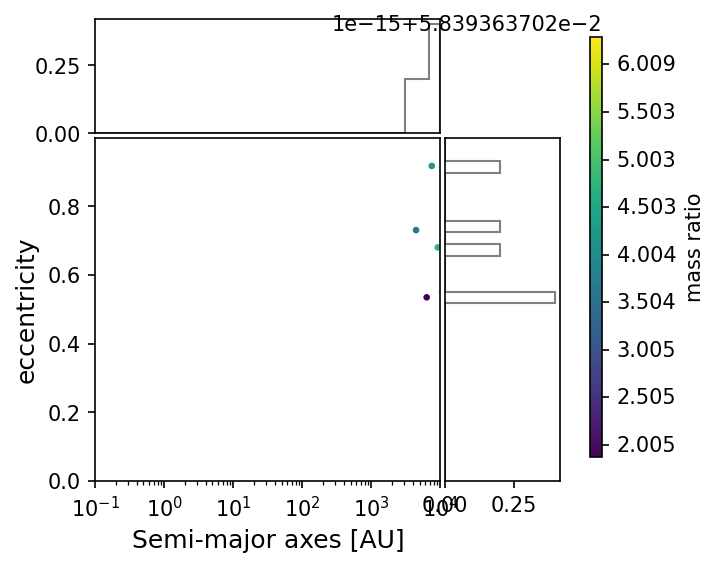

In [ ]:
from matplotlib import gridspec
fig = plt.figure(figsize=(4, 4),dpi=150) 
gs = fig.add_gridspec(2, 2, width_ratios=[3, 1], height_ratios=[1, 3]) 

axexy = fig.add_subplot(gs[1,0])
axehx = fig.add_subplot(gs[0,0],sharex=axexy)
axehy = fig.add_subplot(gs[1,1],sharey=axexy)
axehx.get_xaxis().set_visible(False)
axehy.get_yaxis().set_visible(False)
plt.subplots_adjust(hspace=0.02,wspace=0.02)

xlim=[0.1,1e4]
ylim=[0,0.999]
axexy.set_xlim(*xlim)
axexy.set_ylim(*ylim)
axehx.set_xscale('log')
axexy.set_xlabel(r'Semi-major axes [AU]',fontsize=12)
axexy.set_ylabel(r'eccentricity',fontsize=12)

nbinx=30
nbiny=30
log_xbins=np.logspace(np.log10(xlim[0]),np.log10(xlim[1]), nbinx)
ybins=np.linspace(ylim[0], ylim[1], nbiny)

x = binary.semi*206265
y = binary.ecc
m1 = binary.p1.mass
m2 = binary.p2.mass
mass_ratio = np.minimum(m1,m2)/np.maximum(m1,m2)

axehx.hist(x, bins=log_xbins,histtype='step',color='grey',
           weights=np.ones(x.size)/x.size,label='Initial')
axehy.hist(y, bins=ybins,histtype='step',orientation="horizontal",color='grey',
           weights=np.ones(x.size)/x.size)
pt = axexy.scatter(x ,y, s=binary.mass, c=mass_ratio)
cbaxes = fig.add_axes([0.95,0.15,0.02,0.7]) 
cb = plt.colorbar(pt, cax = cbaxes)  
cb.set_label('mass ratio')

## Reading Lagrangian Properites

Use `petar.LagrangianMultiple` to read the Lagrangian properties of the star cluster generated by `petar.data.process`:

In [ ]:
lagr = petar.LagrangianMultiple()
lagr.loadtxt(path+'data.lagr')

Plot the evolution of core radius and Lagrangian radii

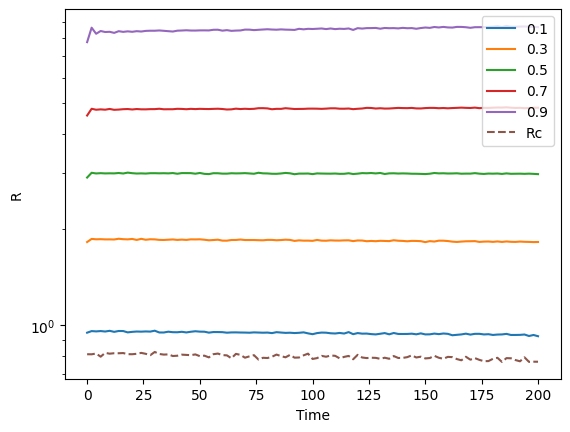

In [ ]:
fig, axes=plt.subplots(1,1)
for i in range(5):
    axes.plot(lagr.time, lagr.all.r[:,i], '-',label=lagr.initargs['mass_fraction'][i])

axes.plot(lagr.time, lagr.all.r[:,-1],'--',label='Rc')
axes.set_xlabel('Time')
axes.set_ylabel('R')
axes.legend(loc='upper right')
axes.set_yscale('log')

## Reading Group Information

By utilizing `petar.GroupInfo`, users can access details regarding the formation and dissolution of various systems, including binaries, triples, quadruples, and more. Upon employing `petar.data.gether -g data`, the group information is saved in files such as `data.group.n2`, `data.group.n3`, where the number denotes the count of members in the multiple systems. The following example demonstrates how to read the groups file and analyze the information.

In [ ]:
# Try cleaning the data before loading
# def clean_data_file(input_file, output_file):
#     """Clean a data file by removing/replacing problematic values"""
#     with open(input_file, 'r') as f:
#         lines = f.readlines()

    # cleaned_lines = []
    # for line in lines:
        # Skip empty lines or comments
        # if line.strip() == '' or line.strip().startswith('#'):
        #     continue

        # Replace problematic values
    #     cleaned_line = line.replace('nan', '0.0').replace('inf', '0.0').replace('-inf', '0.0')
    #     cleaned_lines.append(cleaned_line)
    #
    # with open(output_file, 'w') as f:
    #     f.writelines(cleaned_lines)

# Clean the files and try loading again
# for n in [2, 3, 4]:
#     original_file = f'{path}data.group.n{n}'
#     cleaned_file = f'{path}data.group.n{n}.cleaned'
#
#     clean_data_file(original_file, cleaned_file)

    # Try loading the cleaned version
    # if n == 2:
    #     g2 = petar.GroupInfo(N=2)
    #     g2.loadtxt(cleaned_file)
    # elif n == 3:
    #     g3 = petar.GroupInfo(N=3)
    #     g3.loadtxt(cleaned_file)
    # elif n == 4:
    #     g4 = petar.GroupInfo(N=4)
    #     g4.loadtxt(cleaned_file)

In [ ]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='petar')
warnings.filterwarnings('ignore', category=RuntimeWarning, module='petar')

# load two-body groups (binary, hyperbolic encounters)
g2 = petar.GroupInfo(N=2)
g2.loadtxt(path+'data.group.n2')

# load 3-body
g3 = petar.GroupInfo(N=3)
g3.loadtxt(path+'data.group.n3')

# load 4-body
# g4 = petar.GroupInfo(N=4)
# g4.loadtxt(path+'data.group.n4')

# load 5-body
# g5 = petar.GroupInfo(N=5)
# g5.loadtxt(path+'data.group.n5')

Display a table illustrating the 3-body system, where 'bin0' denotes the outer pair and 'bin1' signifies the inner pair. The center of mass of the inner pair is one of the members of the outer pair. The ID of the center of mass particle is the lower of the two inner member IDs.

In [ ]:
g3.printTable([('bin0.m1','%10.4f', 'outer'),('bin0.m2','%10.4f', 'outer'),
               ('bin0.p1.id','%11d', 'outer'),('bin0.p2.id','%11d', 'outer'),
               ('bin0.semi','%10.4g', 'outer'),('bin0.ecc','%10.4g', 'outer'),
               ('bin1.m1','%10.4f', 'inner'),('bin1.m2','%10.4f', 'inner'),
               ('bin1.p1.id','%11d', 'inner'),('bin1.p2.id','%11d', 'inner'),
               ('bin1.semi','%10.4g', 'inner'),('bin1.ecc','%10.4g', 'inner')])

     outer     outer      outer      outer     outer     outer     inner     inner      inner      inner     inner     inner
    2.3356    4.6712          0      49607-4.569e-05     22.82    0.0000    0.0000         -1          0     4.671-9.296e-06
    2.3356    4.6712          0      49607 -4.57e-05     22.81    0.0000    0.0000         -1          0     4.671-0.0001876


# Scenario with Stellar Evolution (SSE/BSE)

This section explains how to analyze a star cluster simulation that incorporates SSE/BSE. Users can utilize the `star_cluster_bse.sh` script to create a sample model of this nature.

In [ ]:
# path to the simulation directory
path='/home/suphysics3/astro/PeTar/runs/mw2014_agama/'

## Reading Snapshots

Use `petar.Particle` to read the particle information in the snapshot, and include `interrupt_mode='bse'` to specify that SSE/BSE is activated during the compilation of PeTar. It is important to note that even if the stellar evolution option is disabled when using `petar`, but SSE/BSE is compiled, this argument is still required. Additionally, remember to skip the first line when reading the data.

In [ ]:
particle = petar.Particle(interrupt_mode='bse')
particle.loadtxt(path+'data.8',skiprows=1)

## Ploting HR Diagram

With SSE/BSE enabled, it becomes feasible to generate an HR diagram of stars, showcasing different stellar types with distinct colors. Below is an example demonstrating how to accomplish this task.

Notice that the temperature is not directly stored in the dataset but can be computed using the following method.

(1e-05, 1000000.0)

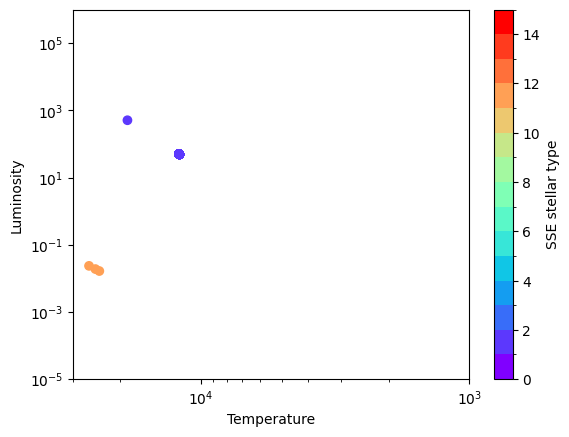

In [ ]:
# luminosity
lum = particle.star.lum
# calculate temperature
temp = 5778*(particle.star.lum/(particle.star.rad*particle.star.rad))**0.25

# plot HR diagram
import matplotlib.colors as colors
fig, axes = plt.subplots(1,1)
norm = colors.BoundaryNorm(boundaries=np.arange(16), ncolors=256)
pt = axes.scatter(temp, lum, c=particle.star.type, cmap='rainbow', norm=norm)
cb = plt.colorbar(pt)
cb.set_label('SSE stellar type')
axes.set_yscale('log')
axes.set_xscale('log')
axes.set_xlabel('Temperature')
axes.set_ylabel('Luminosity')
axes.set_xlim(30000, 1000)
axes.set_ylim(1e-5, 1e6)

## Reading Stellar Evolution Events

When stars or binaries changes types, PeTar record the properties in event files. The follow scripts show how to read these event files generated by `petar.data.process`.

In [ ]:
# type change of stars
sse_type=petar.SSETypeChange()
sse_type.loadtxt(path+'data.sse.type_change')

# supernova kicks of single stars
sse_kick=petar.SSESNKick()
sse_kick.loadtxt(path+'data.sse.sn_kick')

# type change of binaries
bse_type=petar.BSETypeChange()
bse_type.loadtxt(path+'data.bse.type_change')

# supernova kicks in binaries
bse_kick=petar.BSESNKick()
bse_kick.loadtxt(path+'data.bse.sn_kick')

# dynamically driven mergers of hyperbolic encounters
bse_dyn=petar.BSEDynamicMerge()
bse_dyn.loadtxt(path+'data.bse.dynamic_merge')

Print Events in a Table

In [ ]:
bse_type.printTable([('type','%4d','type'),('init.time','%10g','init.time'),('init.type1','%11d','init.type1'),('init.type2','%11d','init.type2'),
                     ('init.m1','%9f','init.m1'),('init.m2','%9f','init.m2'),('init.semi','%10g','init.semi'),('init.ecc','%9f','init.ecc'),
                     ('final.type1','%12d','final.type1'),('final.type2','%12d','final.type2'),('final.m1','%9f','final.m1'),('final.m2','%9f','final.m2'),
                     ('final.semi','%11g','final.semi'),('final.ecc','%10g','final.ecc')])

type init.time init.type1 init.type2  init.m1  init.m2 init.semi init.ecc final.type1 final.type2 final.m1 final.m2 final.semi final.ecc
  13         0          1          1 2.335943 2.335943  -8664.39 5.330441           1           1 2.335943 2.335943    8660.66   5.33044
  13   29.5635          1          1 2.335799 2.335799  -6804.52 6.129230           1           1 2.335799 2.335799    6801.59   6.12923
  13   29.5636          1          1 2.335799 2.335799  -6166.76 7.933100           1           1 2.335799 2.335799     6164.1    7.9331
  13   29.5636          1          1 2.335799 2.335799  -44040.1 1.034077           1           1 2.335799 2.335799    44021.1   1.03408
  13   29.5638          1          1 2.335799 2.335799  -559.22919.343646           1           1 2.335799 2.335799    558.988   19.3436
  13   29.5638          1          1 2.335799 2.335799  -38852.5 1.475268           1           1 2.335799 2.335799    38835.8   1.47527
  13    29.564          1          1 2.33

## Gather Merger Events

Use `petar.BSEMerge`, users can gather the information of binary and hyperbolic mergers from binary type change and dynamical merger events. Below is an example demonstrating how to accomplish this task.

Please be aware that in some cases, supernova events in binaries can completely disrupt a star, leaving no remnant behind. Such occurrences may mistakenly be classified as mergers. Therefore, the merger events identified here are considered 'candidates'. It is recommended to examine the evolutionary history of these mergers to confirm whether they are indeed true mergers.

In [ ]:
merger = petar.BSEMerge()
# Gather events
merger.combine(bse_type, bse_dyn)

# Print information of mergers
merger.printTable()

   time[Myr]           bid     id1     id2  semi[R*]            ecc k1i k2i     m1i[M*]     m2i[M*]  kf      mf[M*]
  32.8999447   24202897812   72278  147734 -1877.277   1.0009085282   1   1      2.3358      2.3358   1   4.6715638
  37.1593108     591517878    7331   27063 -927.9228   1.0028949173   1   1      2.3358      2.3358   1   4.6715202
  43.1784155    6410560415   12649  100580 -12695.28   1.0000032596   1   1      2.3357      2.3357   1   4.6714581
 193.9508248    4573317475   43865   51772 -1860.854   1.0006354559   1   1      2.3348      2.3348   1   4.6696843


## Gather Specified Objects

Using `petar.get.object.snap`, users can scan a list of snapshots and gather specified objects into a single file with a time sequence based on selected single/binary IDs, stellar types, mass regions, or user-defined selection functions. For instance, after applying `petar.data.gether` and `petar.data.process`, running this tool to gather all binary main sequence stars (BMSs) in a simulation can be done with the following command:

```
petar.get.object.snap -i bse -f binary -m type MS MS data.snap.lst
```

In this command, `data.snap.lst` represents the snapshot list generated by `petar.data.gether`. Executing this command will create a new file named `object.MS.MS.binary`, which contains all BMSs detected in the snapshots.

To read this file, a similar approach to reading binary snapshots generated by `petar.data.process` is required, with the addition of a new member `time` that needs to be included before reading.

In [ ]:
bms = petar.Binary(member_particle_type=petar.Particle, interrupt_mode='bse', G=petar.G_MSUN_PC_MYR)
bms.addNewMember('time', np.array([]).astype(float))
bms.loadtxt(path+'object.MS.MS.binary')

With the retrieved data, we can visualize the evolution of binary parameters, such as the semi-major axes of all BMS.

Text(0, 0.5, 'semi-major axes [pc]')

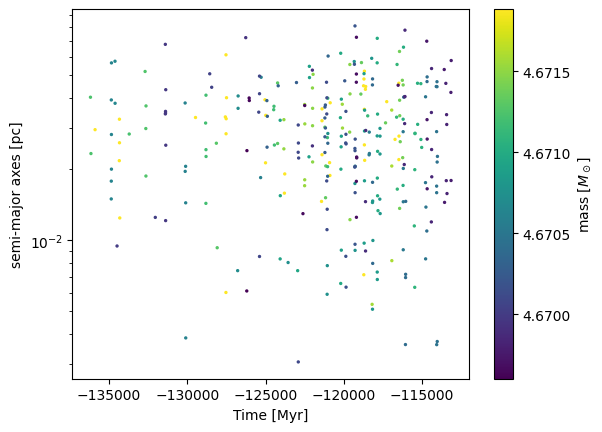

In [ ]:
fig, axes = plt.subplots(1,1)
pt = axes.scatter(bms.time, bms.semi, c=bms.mass, s=2)
cb = plt.colorbar(pt)
cb.set_label(r'mass [$M_\odot$]')
axes.set_yscale('log')
axes.set_xlabel('Time [Myr]')
axes.set_ylabel('semi-major axes [pc]')

As another example, we collect the data of a star with ID = 1 from original snapshots generated by `petar` using the command:
```
petar.get.object.snap -i bse -f origin -m id 1 data.snap.lst
```
The resulting output file is named `object.1`.
The method for reading this file is akin to reading single and original snapshot files, with the addition of the new member `time`.

In [ ]:
# p1 = petar.Particle(interrupt_mode='bse')
# p1.addNewMember('time', np.array([]).astype(float))
# p1.loadtxt(path+'object.1')

Next, we plot the trajectory of particle 1 in the x-y plane:

In [ ]:
# fig, axes = plt.subplots(1,1)
# axes.plot(p1.pos[:,0],p1.pos[:,1],'-',c='grey')
# pt = axes.scatter(p1.pos[:,0], p1.pos[:,1], c=p1.time)
# cb = plt.colorbar(pt)
# cb.set_label(r'time [Myr]')
# axes.set_xlabel('x [pc]')
# axes.set_ylabel('y [pc]')
# axes.set_aspect(1)

# Scenario with SSE/BSE and Galpy

This section explains how to analyze a star cluster simulation that incorporates SSE/BSE and Galactic potential (Galpy). Users can use the `star_cluster_bse_galpy.sh` script to create a sample model of this nature.

In [ ]:
# path to the simulation directory
path='/home/suphysics3/astro/PeTar/runs/mw2014_agama/'

## Reading the Cluster Center Position and Velocity

When using the Galactic potential, the coordinate system center in the simulation is aligned with the Galactic center. The header of snapshots contains information about the position and velocity of the cluster potential center, and all particle coordinates are relative to this center. The script below reads the header, and the `pos_offset` and `vel_offset` variables indicate the center position and velocity.

In [ ]:
header = petar.PeTarDataHeader(path+'data.10',external_mode='galpy')

In [ ]:
print('Center position:',header.pos_offset, '\nCenter velocity:', header.vel_offset)

Center position: [-484.3144136338306, -2056.853430104612, 1098.0585902664618] 
Center velocity: [-194.37110183975642, 16.80994362023552, 60.8628637518689]


## Reading Snapshots 

Use `petar.Particle` to read the particle information in the snapshot, and include `interrupt_mode='bse' external_mode=galpy` to specify that SSE/BSE and Galpy is activated during the compilation of PeTar. It is important to note that even if the stellar evolution option is disabled or no external potential is enabled when using `petar`, but SSE/BSE and Galpy are both compiled, this argument is still required. Additionally, remember to skip the first line when reading the data.

In [ ]:
particle = petar.Particle(interrupt_mode='bse', external_mode='galpy')
particle.loadtxt(path+'data.8',skiprows=1)

## Converting to Astropy SkyCoord Data Type

The `astropy.SkyCoord` module offers a robust coordinate conversion method that can be useful for converting simulation data into observational coordinate systems like ICRS. By utilizing the `toSkyCoord` method, you can convert the header and snapshot data into the `SkyCoord` format:

In [ ]:
center_sc = header.toSkyCoord()
snap_sc = particle.toSkyCoord(pos_offset=header.pos_offset, vel_offset=header.vel_offset)

Get the position and velocity in ICRS frame

In [ ]:
# print center in ICRS frame
print(center_sc.icrs)
# print first 10 particles in ICRS frame
print(snap_sc[:10].icrs)

<SkyCoord (ICRS): (ra, dec, distance) in (deg, deg, pc)
    (247.90820486, -36.42811486, 7866.95496348)
 (pm_ra_cosdec, pm_dec, radial_velocity) in (mas / yr, mas / yr, km / s)
    (-6.17364216, -3.92964707, -126.74773705)>
<SkyCoord (ICRS): (ra, dec, distance) in (deg, deg, pc)
    [(247.91516607, -36.42551837, 7867.1139709 ),
     (247.91098498, -36.41697409, 7868.21348775),
     (247.93793924, -36.44180209, 7871.07886982),
     (247.91588096, -36.43758939, 7867.32271779),
     (247.95090776, -36.43028969, 7865.10450312),
     (247.92000346, -36.42796763, 7867.37977507),
     (247.9094414 , -36.40724772, 7874.59460307),
     (247.89942056, -36.38621471, 7866.39257758),
     (247.8934199 , -36.35013543, 7866.53770901),
     (247.8957408 , -36.42163129, 7868.40623994)]
 (pm_ra_cosdec, pm_dec, radial_velocity) in (mas / yr, mas / yr, km / s)
    [(-5.98174408, -3.71912451, -128.99646279),
     (-6.37168392, -3.68044128, -137.49197952),
     (-6.1741121 , -4.13933248, -130.14422112),
   

## Plotting RA-Dec and Proper Motion

With the SkyCoord format, plotting RA-Dec and Proper Motion of stars becomes straightforward. The following example selects stars within 10 parsecs from the cluster center and visualizes their RA-Dec and Proper Motion distribution. Stellar types are distinguished by colors, and star sizes correspond to their masses.

Text(0, 0.5, 'pm_Dec')

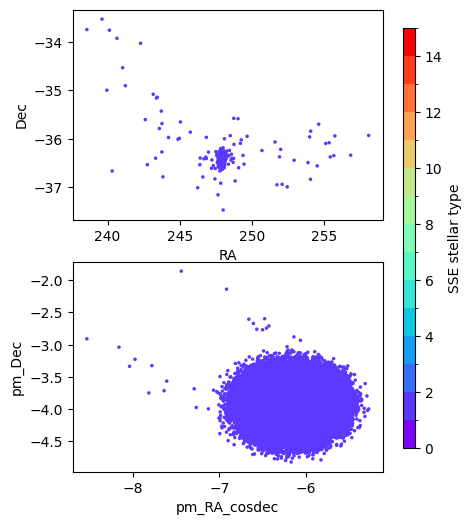

In [ ]:
fig, axes = plt.subplots(2,1, figsize=(4,6))

# select stars based on distance
particle.calcR2()
r = np.sqrt(particle.r2)
sel = (r<300000000)

# RA-Dec
norm = colors.BoundaryNorm(boundaries=np.arange(16), ncolors=256)
pt1 = axes[0].scatter(snap_sc.icrs.ra[sel], snap_sc.icrs.dec[sel], s = particle.mass[sel], c=particle.star.type[sel], cmap='rainbow', norm=norm)
cbaxes = fig.add_axes([0.95, 0.15, 0.03, 0.7]) 
cb = plt.colorbar(pt1, cax = cbaxes)  
cb.set_label('SSE stellar type')
axes[0].set_xlabel('RA')
axes[0].set_ylabel('Dec')

# Proper Motion
axes[1].scatter(snap_sc.icrs.pm_ra_cosdec[sel], snap_sc.icrs.pm_dec[sel], s = particle.mass[sel], c=particle.star.type[sel], cmap='rainbow', norm=norm)
axes[1].set_xlabel('pm_RA_cosdec')
axes[1].set_ylabel('pm_Dec')


In [ ]:
# Load the core data
core = petar.Core()
core.loadtxt(path + 'data.core')

# Explore what's available
print("Core data attributes:")
print([attr for attr in dir(core) if not attr.startswith('_')])
print(f"Data shape: {core.time.shape if hasattr(core, 'time') else 'No time'}")

Core data attributes:
['addNewMember', 'addTime', 'append', 'calcCoreRadius', 'calcDensityAndCenter', 'calcPotentialCenter', 'collectDtype', 'copy', 'fromfile', 'getColumnInfo', 'getherDataToArray', 'host', 'initargs', 'keys', 'load', 'loadtxt', 'ncols', 'operate', 'pos', 'printSize', 'printTable', 'rc', 'readArray', 'readArrayWithName', 'repeat', 'resize', 'save', 'savetxt', 'setHost', 'size', 'time', 'toSkyCoord', 'tofile', 'updateHostNcols', 'vel']
Data shape: (101,)


In [ ]:
# Check what's available in your particle data
print("Particle attributes:")
particle_attrs = [attr for attr in dir(particle) if not attr.startswith('_')]
print(particle_attrs)

# Check what's in the sky coordinate object
print("\nSky coordinate attributes:")
sky_attrs = [attr for attr in dir(snap_sc.icrs) if not attr.startswith('_')]
print(sky_attrs)

# Look specifically for radial velocity
rv_attrs = [attr for attr in sky_attrs if 'rv' in attr.lower() or 'radial' in attr.lower() or 'vel' in attr.lower()]
print(f"\nPotential RV attributes: {rv_attrs}")

Particle attributes:
['acc_soft', 'addNewMember', 'append', 'binary_state', 'calcEkin', 'calcEtot', 'calcR2', 'collectDtype', 'copy', 'correctCenter', 'dm', 'fromfile', 'getColumnInfo', 'getherDataToArray', 'host', 'id', 'initargs', 'keys', 'load', 'loadtxt', 'mass', 'mass_bk', 'n_nb', 'ncols', 'operate', 'pos', 'pot', 'pot_ext', 'pot_soft', 'printSize', 'printTable', 'r2', 'r_in', 'r_out', 'r_search', 'radius', 'readArray', 'readArrayWithName', 'repeat', 'resize', 'save', 'savetxt', 'setHost', 'size', 'star', 'status', 'time_interrupt', 'time_record', 'toSkyCoord', 'tofile', 'updateHostNcols', 'vel']

Sky coordinate attributes:
['T', 'altaz', 'apply_space_motion', 'barycentricmeanecliptic', 'barycentrictrueecliptic', 'cache', 'cartesian', 'cirs', 'contained_by', 'copy', 'custombarycentricecliptic', 'cylindrical', 'data', 'dec', 'default_differential', 'default_representation', 'diagonal', 'differential_type', 'directional_offset_by', 'distance', 'equinox', 'filled', 'fk4', 'fk4noeterm

In [ ]:
# Check if radial_velocity attribute exists
if hasattr(snap_sc.icrs, 'radial_velocity'):
    print("Radial velocity found!")
    rv = snap_sc.icrs.radial_velocity[sel]
    print(f"RV range: {rv.min()} to {rv.max()}")
elif hasattr(snap_sc, 'radial_velocity'):
    print("Radial velocity found in snap_sc!")
    rv = snap_sc.radial_velocity[sel]
else:
    print("No radial velocity found - we'll need to calculate it")
    rv = None

Radial velocity found!
RV range: -160.34154486636885 km / s to -94.22012245579118 km / s


In [ ]:
# Look for position-related attributes
position_attrs = [attr for attr in dir(core) if 'pos' in attr.lower() or 'x' in attr.lower() or 'y' in attr.lower() or 'z' in attr.lower()]
print("Position-related attributes:", position_attrs)

# Check the time array
if hasattr(core, 'time'):
    print(f"Time range: {core.time.min()} to {core.time.max()}")
    print(f"Number of timesteps: {len(core.time)}")

Position-related attributes: ['__reduce_ex__', '__sizeof__', 'calcDensityAndCenter', 'collectDtype', 'copy', 'getherDataToArray', 'keys', 'loadtxt', 'pos', 'printSize', 'readArray', 'readArrayWithName', 'resize', 'savetxt', 'size', 'toSkyCoord']
Time range: 0.0 to 200.0
Number of timesteps: 101


In [ ]:
# Check the shape and structure of position data
print("Position array shape:", core.pos.shape)
print("Velocity array shape:", core.vel.shape)
print("First few position values:")
print(core.pos[:3])  # First 3 timesteps

Position array shape: (101, 3)
Velocity array shape: (101, 3)
First few position values:
[[ 2303.1949298     87.53105158 -1227.51090656]
 [ 2215.09851121  -268.84519029 -1150.23881262]
 [ 2079.90977042  -619.41923827 -1015.03119726]]


Orbital range - X: -2754.40 to 2510.24
Orbital range - Y: -2717.03 to 2524.89
Orbital range - Z: -1227.51 to 1293.04


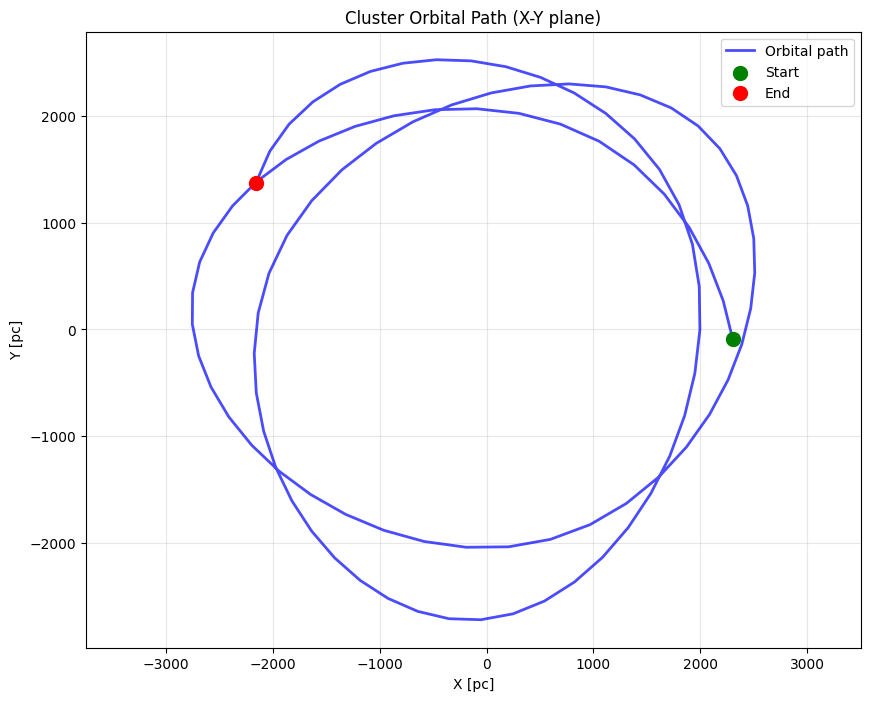

In [ ]:
# Extract coordinates (assuming pos is shape (21, 3) for X, Y, Z)
time = core.time
x = core.pos[:, 0]  # X coordinate
y = -core.pos[:, 1]  # Y coordinate (inverted for plotting purposes)
z = core.pos[:, 2]  # Z coordinate

print(f"Orbital range - X: {x.min():.2f} to {x.max():.2f}")
print(f"Orbital range - Y: {y.min():.2f} to {y.max():.2f}")
print(f"Orbital range - Z: {z.min():.2f} to {z.max():.2f}")

# 2D orbital plot (X-Y plane)
plt.figure(figsize=(10, 8))
plt.plot(x, y, 'b-', alpha=0.7, linewidth=2, label='Orbital path')
plt.scatter(x[0], y[0], color='green', s=100, label='Start', zorder=5)
plt.scatter(x[-1], y[-1], color='red', s=100, label='End', zorder=5)
plt.xlabel('X [pc]')  # Adjust units as needed
plt.ylabel('Y [pc]')
plt.title('Cluster Orbital Path (X-Y plane)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.axis('equal')
plt.show()

Orbital range - X: -2754.40 to 2510.24
Orbital range - Y: -2524.89 to 2717.03
Orbital range - Z: -1227.51 to 1293.04


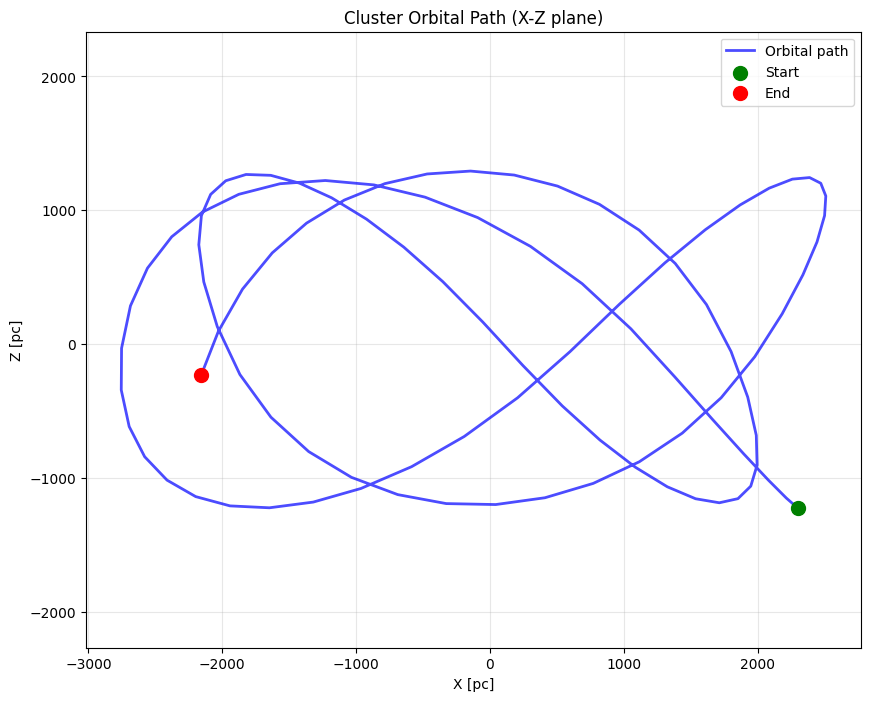

In [ ]:
# Extract coordinates (assuming pos is shape (21, 3) for X, Y, Z)
time = core.time
x = core.pos[:, 0]  # X coordinate
y = core.pos[:, 1]  # Y coordinate
z = core.pos[:, 2]  # Z coordinate

print(f"Orbital range - X: {x.min():.2f} to {x.max():.2f}")
print(f"Orbital range - Y: {y.min():.2f} to {y.max():.2f}")
print(f"Orbital range - Z: {z.min():.2f} to {z.max():.2f}")

# 2D orbital plot (X-Y plane)
plt.figure(figsize=(10, 8))
plt.plot(x, z, 'b-', alpha=0.7, linewidth=2, label='Orbital path')
plt.scatter(x[0], z[0], color='green', s=100, label='Start', zorder=5)
plt.scatter(x[-1], z[-1], color='red', s=100, label='End', zorder=5)
plt.xlabel('X [pc]')  # Adjust units as needed
plt.ylabel('Z [pc]')
plt.title('Cluster Orbital Path (X-Z plane)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.axis('equal')
plt.show()

Orbital range - X: -2754.40 to 2510.24
Orbital range - Y: -2717.03 to 2524.89
Orbital range - Z: -1227.51 to 1293.04


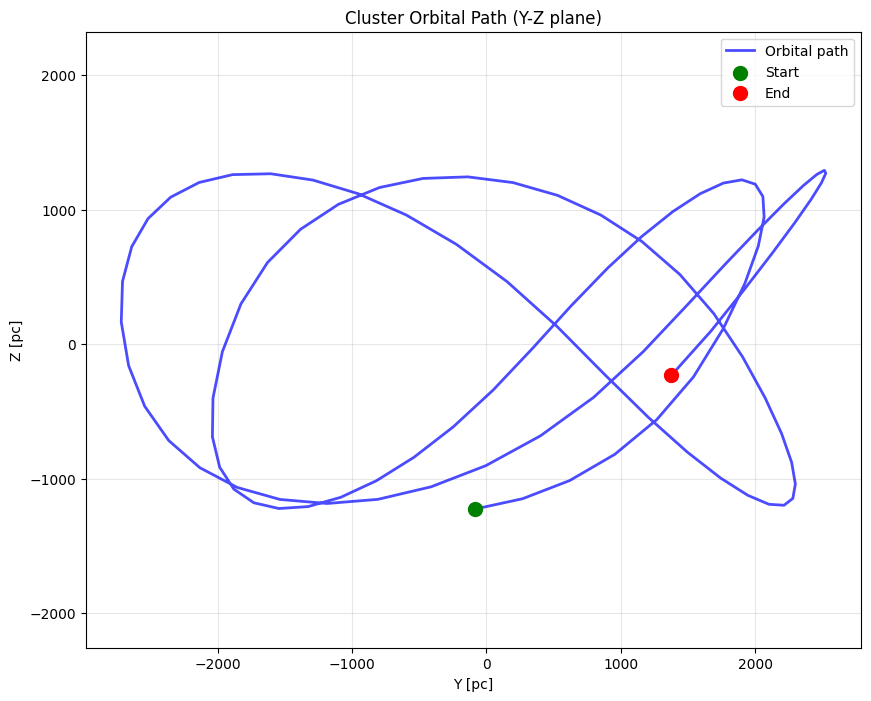

In [ ]:
# Extract coordinates (for X, Y, Z)
time = core.time
x = core.pos[:, 0]  # X coordinate
y = -core.pos[:, 1]  # Y coordinate
z = core.pos[:, 2]  # Z coordinate

print(f"Orbital range - X: {x.min():.2f} to {x.max():.2f}")
print(f"Orbital range - Y: {y.min():.2f} to {y.max():.2f}")
print(f"Orbital range - Z: {z.min():.2f} to {z.max():.2f}")

# 2D orbital plot (X-Y plane)
plt.figure(figsize=(10, 8))
plt.plot(y, z, 'b-', alpha=0.7, linewidth=2, label='Orbital path')
plt.scatter(y[0], z[0], color='green', s=100, label='Start', zorder=5)
plt.scatter(y[-1], z[-1], color='red', s=100, label='End', zorder=5)
plt.xlabel('Y [pc]')  # Adjust units as needed
plt.ylabel('Z [pc]')
plt.title('Cluster Orbital Path (Y-Z plane)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.axis('equal')
plt.show()

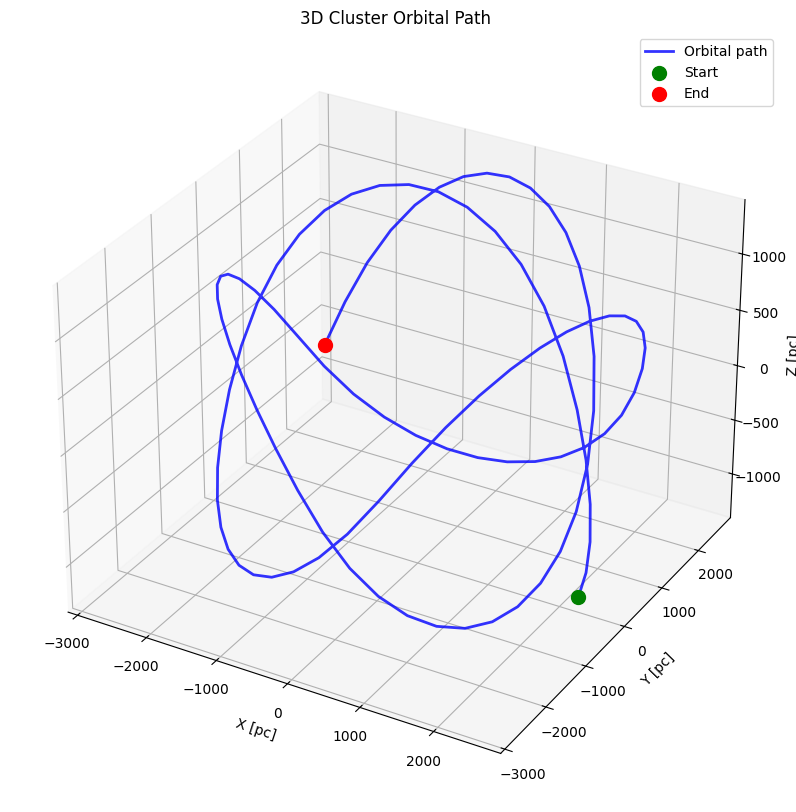

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot the 3D orbital path
ax.plot(x, y, z, 'b-', alpha=0.8, linewidth=2, label='Orbital path')
ax.scatter(x[0], y[0], z[0], color='green', s=100, label='Start')
ax.scatter(x[-1], y[-1], z[-1], color='red', s=100, label='End')

ax.set_xlabel('X [pc]')
ax.set_ylabel('Y [pc]')
ax.set_zlabel('Z [pc]')
ax.set_title('3D Cluster Orbital Path')
ax.legend()
plt.show()
plt.show()

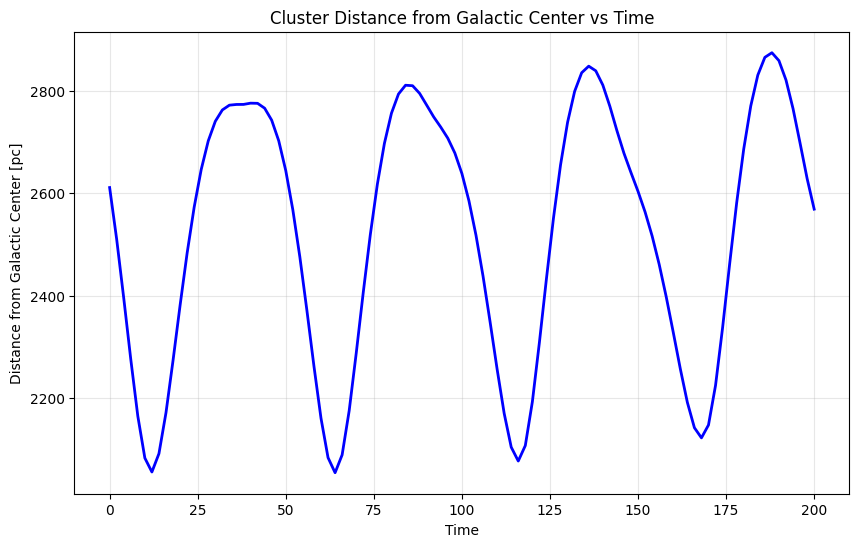

In [ ]:
# Distance from galactic center vs time
r_gc = np.sqrt(x**2 + y**2 + z**2)

plt.figure(figsize=(10, 6))
plt.plot(time, r_gc, 'b-', linewidth=2)
plt.xlabel('Time')  # Add your time units
plt.ylabel('Distance from Galactic Center [pc]')
plt.title('Cluster Distance from Galactic Center vs Time')
plt.grid(True, alpha=0.3)
plt.show()

Mass Loss

Text(0, 0.5, 'Cumulative escaped mass')

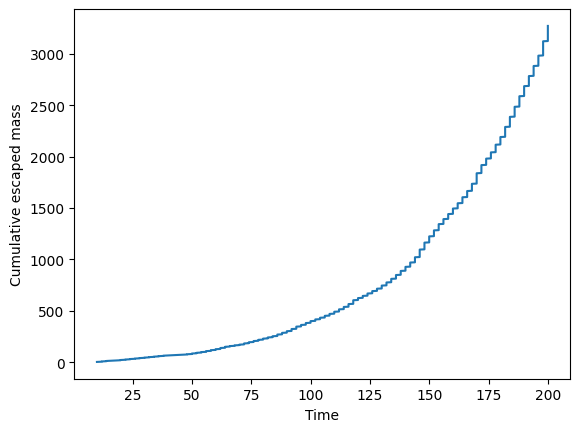

In [ ]:
esc = petar.SingleEscaper()
esc.loadtxt(path + 'data.esc_single')

# escaped mass and count as functions of time (sort by escape time first)
order = np.argsort(esc.time)
t = esc.time[order]
m_cum = np.cumsum(esc.mass[order])

fig, axes = plt.subplots(1,1)
axes.plot(t, m_cum)
axes.set_xlabel('Time')
axes.set_ylabel('Cumulative escaped mass')


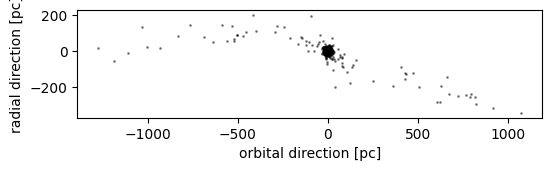

In [ ]:
header = petar.PeTarDataHeader(path+'data.8', external_mode='galpy')
particle = petar.Particle(interrupt_mode='bse', external_mode='galpy')
particle.loadtxt(path+'data.8', skiprows=1)

# build orbital frame: r_hat = radial (away from Galactic center), v_hat = orbital direction
r_hat = header.pos_offset / np.linalg.norm(header.pos_offset)
v_hat = header.vel_offset / np.linalg.norm(header.vel_offset)
v_hat = v_hat - np.dot(v_hat, r_hat)*r_hat   # orthogonalize
v_hat /= np.linalg.norm(v_hat)

x = particle.pos @ r_hat   # radial offset from cluster center
y = particle.pos @ v_hat   # along-orbit offset

fig, axes = plt.subplots(1,1, figsize=(6,6))
axes.scatter(y, x, s=1, c='k', alpha=0.4)
axes.set_ylabel('radial direction [pc]')
axes.set_xlabel('orbital direction [pc]')
axes.set_aspect(1)


In [ ]:

header = petar.PeTarDataHeader(path+'data.8', external_mode='galpy')
particle = petar.Particle(interrupt_mode='bse', external_mode='galpy')
particle.loadtxt(path+'data.8', skiprows=1)

print('time [Myr]:', header.time)
print('n particles:', particle.n if hasattr(particle,'n') else len(particle.mass))
print('cluster center pos_offset [pc]:', header.pos_offset)

time [Myr]: 200.0
n particles: 149996
cluster center pos_offset [pc]: [-2157.5770884968197, -1375.2440062812616, -233.10685916296407]


In [ ]:
# import sys
# sys.path.append('/usr/local/bin')
# import petar
# import numpy as np

# path = '/home/suphysics3/astro/PeTar/runs/mw2014_agama/'
# n_snap = 101  # data.0 ... data.100, 2 Myr spacing

# time_arr = np.zeros(n_snap)
# bound_mass_arr = np.zeros(n_snap)

# for i in range(n_snap):
#     fname = f'{path}data.{i}'
#     header = petar.PeTarDataHeader(fname, external_mode='galpy')
#     p = petar.Particle(interrupt_mode='bse', external_mode='galpy')
#     p.loadtxt(fname, skiprows=1)

#     p.calcEkin()
#     self_grav_pot = p.pot - p.pot_ext       # strip out the external field, keep self-gravity only
#     etot_self = p.ekin + p.mass * self_grav_pot

#     bound = etot_self < 0
#     time_arr[i] = header.time
#     bound_mass_arr[i] = p.mass[bound].sum()

#     if i % 10 == 0:
#         print(f'snapshot {i}: t={header.time:.1f} Myr, bound fraction={bound.mean():.6f}')


In [ ]:
# M0 = bound_mass_arr[0]

# fig, ax = plt.subplots(figsize=(8, 5))
# ax.plot(time_arr, bound_mass_arr / M0)
# ax.set_xlabel('Time [Myr]', size=14)
# ax.set_ylabel(r'$M/M_0$', size=14)
# ax.set_title('NGC 6569 Bound Mass Loss (PeTar)', size=16)
# fig.tight_layout()


In [ ]:
# esc = petar.SingleEscaper()
# esc.loadtxt(path + 'data.esc_single')

# # escaped mass and count as functions of time (sort by escape time first)
# order = np.argsort(esc.time)
# t = esc.time[order]
# m_cum = np.cumsum(esc.mass[order])

# # original cluster mass, from the initial snapshot
# d0 = np.loadtxt(path + 'data.0', skiprows=1)
# M0 = d0[:, 0].sum()

# fig, axes = plt.subplots(1, 1)
# axes.plot(t, 100 * m_cum / M0)
# axes.set_xlabel('Time')
# axes.set_ylabel('% of Original Mass Lost')

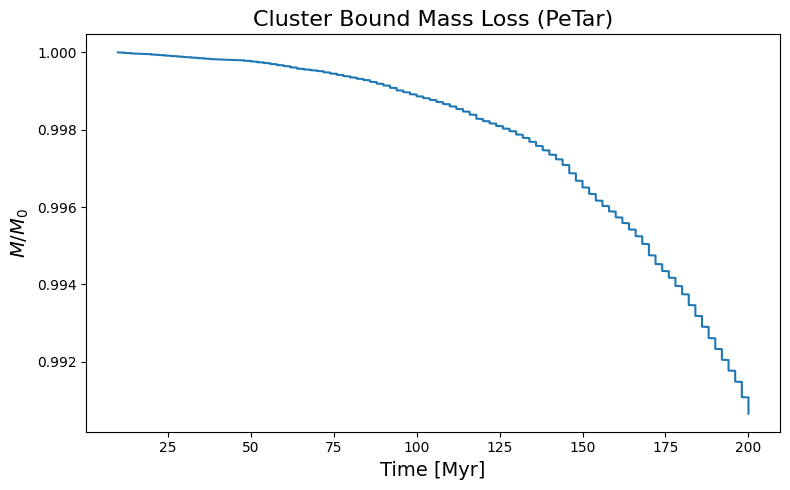

In [ ]:
esc = petar.SingleEscaper()
esc.loadtxt(path + 'data.esc_single')

order = np.argsort(esc.time)
t = esc.time[order]
m_cum = np.cumsum(esc.mass[order])

d0 = np.loadtxt(path + 'data.0', skiprows=1)
M0 = d0[:, 0].sum()

fig, axes = plt.subplots(1, 1, figsize=(8, 5))
axes.plot(t, (M0 - m_cum) / M0)
axes.set_xlabel('Time [Myr]', size=14)
axes.set_ylabel(r'$M/M_0$', size=14)
axes.set_title('Cluster Bound Mass Loss (PeTar)', size=16)
fig.tight_layout()

## Mass Loss Overlay: PeTar vs. Tidal-Tensor (Particle Spray)

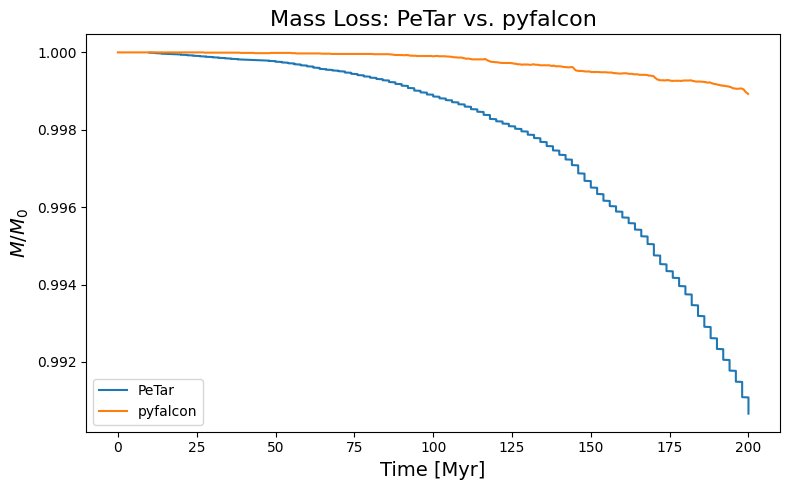

In [60]:
esc = petar.SingleEscaper()
esc.loadtxt(path + 'data.esc_single')

order = np.argsort(esc.time)
t = esc.time[order]
m_cum = np.cumsum(esc.mass[order])

d0 = np.loadtxt(path + 'data.0', skiprows=1)
M0 = d0[:, 0].sum()

fig, axes = plt.subplots(1, 1, figsize=(8, 5))
axes.plot(t, (M0 - m_cum) / M0, label='PeTar')

# Overlay the tidal-tensor / particle-spray mass loss from NGC6569_Dev3_bugfix2.ipynb.
# Run the save cell right after that notebook's "Mass Loss" section first to
# (re)generate this file from the live traj / time_array / M0 in that kernel.
tidal_ml_path = '/home/suphysics/PycharmProjects/PythonProject/tidal_stream_research_26/joes_Code/ngc6569/ngc6569_tidal_mass_loss.npz'
tidal_ml = np.load(tidal_ml_path)
axes.plot(tidal_ml['time_myr'], tidal_ml['mass_frac'], label='pyfalcon')

axes.set_xlabel('Time [Myr]', size=14)
axes.set_ylabel(r'$M/M_0$', size=14)
axes.set_title('Mass Loss: PeTar vs. pyfalcon', size=16)
axes.legend()
fig.tight_layout()


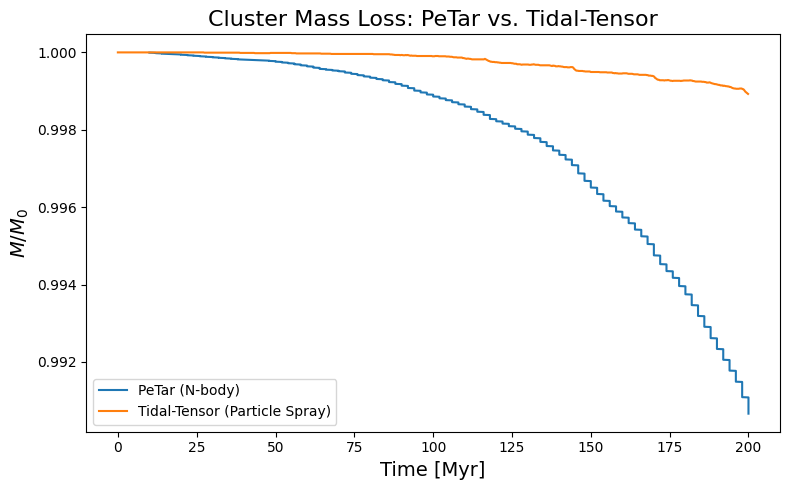

In [ ]:
esc = petar.SingleEscaper()
esc.loadtxt(path + 'data.esc_single')

order = np.argsort(esc.time)
t = esc.time[order]
m_cum = np.cumsum(esc.mass[order])

d0 = np.loadtxt(path + 'data.0', skiprows=1)
M0 = d0[:, 0].sum()

fig, axes = plt.subplots(1, 1, figsize=(8, 5))
axes.plot(t, (M0 - m_cum) / M0, label='PeTar (N-body)')

# Overlay the tidal-tensor / particle-spray mass loss from NGC6569_Dev3_bugfix2.ipynb.
# Run the save cell right after that notebook's "Mass Loss" section first to
# (re)generate this file from the live traj / time_array / M0 in that kernel.
tidal_ml_path = '/home/suphysics/PycharmProjects/PythonProject/tidal_stream_research_26/joes_Code/ngc6569/ngc6569_tidal_mass_loss.npz'
tidal_ml = np.load(tidal_ml_path)
axes.plot(tidal_ml['time_myr'], tidal_ml['mass_frac'], label='Tidal-Tensor (Particle Spray)')

axes.set_xlabel('Time [Myr]', size=14)
axes.set_ylabel(r'$M/M_0$', size=14)
axes.set_title('Cluster Mass Loss: PeTar vs. Tidal-Tensor', size=16)
axes.legend()
fig.tight_layout()
